# Data Quality Visualization
Compare original images with 6 augmented samples (3 rain + 3 snow styles)

In [1]:
import pyarrow as pa
import io
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
import os
import random

# Paths
BASE_DIR = Path(".")
ORIGINAL_FILE = BASE_DIR / "LouisChen15___construction_site/construction_site-test.arrow"
AUGMENTED_DIR = BASE_DIR / "output/construction_site_test"

# Style folders
STYLES = ["style_rain_0", "style_rain_1", "style_rain_2", "style_snow_0", "style_snow_1", "style_snow_2"]

In [2]:
def load_arrow_file(path):
    """Load Arrow IPC file"""
    with open(path, 'rb') as f:
        reader = pa.ipc.open_stream(f)
        table = reader.read_all()
    return table

def get_image_from_row(row):
    """Extract PIL Image from Arrow row"""
    image_data = row['image'][0].as_py()
    if isinstance(image_data, dict):
        img_bytes = image_data['bytes']
        return Image.open(io.BytesIO(img_bytes))
    return None

# Load original data
original_table = load_arrow_file(ORIGINAL_FILE)
print(f"Loaded original data: {len(original_table)} samples")
print(f"Columns: {original_table.column_names}")

Loaded original data: 3004 samples
Columns: ['image', 'image_id', 'image_caption', 'illumination', 'camera_distance', 'view', 'quality_of_info', 'rule_1_violation', 'rule_2_violation', 'rule_3_violation', 'rule_4_violation', 'excavator', 'rebar', 'worker_with_white_hard_hat']


In [3]:
# Build index: image_id -> row index for fast lookup
original_index = {}
for idx in range(len(original_table)):
    image_id = original_table['image_id'][idx].as_py()
    original_index[image_id] = idx

print(f"Built index with {len(original_index)} entries")
print(f"Sample IDs: {list(original_index.keys())[:5]}")

Built index with 3004 entries
Sample IDs: ['0000001', '0000002', '0000005', '0000007', '0000009']


In [4]:
def load_augmented_samples_by_ref_id(ref_id, augmented_dir, styles):
    """
    Load augmented samples for a given ref_id from all style folders.
    Returns dict: {style_name: PIL.Image}
    """
    augmented_images = {}
    
    for style in styles:
        style_dir = augmented_dir / style
        if not style_dir.exists():
            continue
            
        # Search through all batch files
        for batch_file in sorted(style_dir.glob("batch_*.arrow")):
            try:
                table = load_arrow_file(batch_file)
                if 'ref_id' not in table.column_names:
                    continue
                    
                # Find row with matching ref_id
                for idx in range(len(table)):
                    row_ref_id = table['ref_id'][idx].as_py()
                    if row_ref_id == ref_id:
                        row = table.slice(idx, 1)
                        img = get_image_from_row(row)
                        if img:
                            augmented_images[style] = img
                        break
                        
                if style in augmented_images:
                    break  # Found for this style, move to next
                    
            except Exception as e:
                continue
                
    return augmented_images


def visualize_sample(ref_id, original_table, original_index, augmented_dir, styles):
    """Visualize original image and all 6 augmented versions"""
    # Get original image
    if ref_id not in original_index:
        print(f"ref_id '{ref_id}' not found in original data!")
        return
        
    orig_idx = original_index[ref_id]
    orig_row = original_table.slice(orig_idx, 1)
    orig_img = get_image_from_row(orig_row)
    
    # Get augmented images
    aug_images = load_augmented_samples_by_ref_id(ref_id, augmented_dir, styles)
    
    # Create figure: 1 original + 6 augmented
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    fig.suptitle(f"Sample: {ref_id}", fontsize=14)
    
    # Original
    axes[0, 0].imshow(orig_img)
    axes[0, 0].set_title("Original", fontsize=12)
    axes[0, 0].axis('off')
    
    # Augmented (rain styles in row 1, snow styles in row 2)
    style_positions = [
        ("style_rain_0", 0, 1), ("style_rain_1", 0, 2), ("style_rain_2", 0, 3),
        ("style_snow_0", 1, 1), ("style_snow_1", 1, 2), ("style_snow_2", 1, 3)
    ]
    
    for style, row, col in style_positions:
        if style in aug_images:
            axes[row, col].imshow(aug_images[style])
            axes[row, col].set_title(style.replace("_", " ").title(), fontsize=12)
        else:
            axes[row, col].text(0.5, 0.5, "Not Found", ha='center', va='center')
            axes[row, col].set_title(style.replace("_", " ").title() + " (N/A)", fontsize=12)
        axes[row, col].axis('off')
    
    # Hide empty cell (1,0)
    axes[1, 0].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return aug_images

## Visualize Random Sample

Visualizing random sample: 0000221


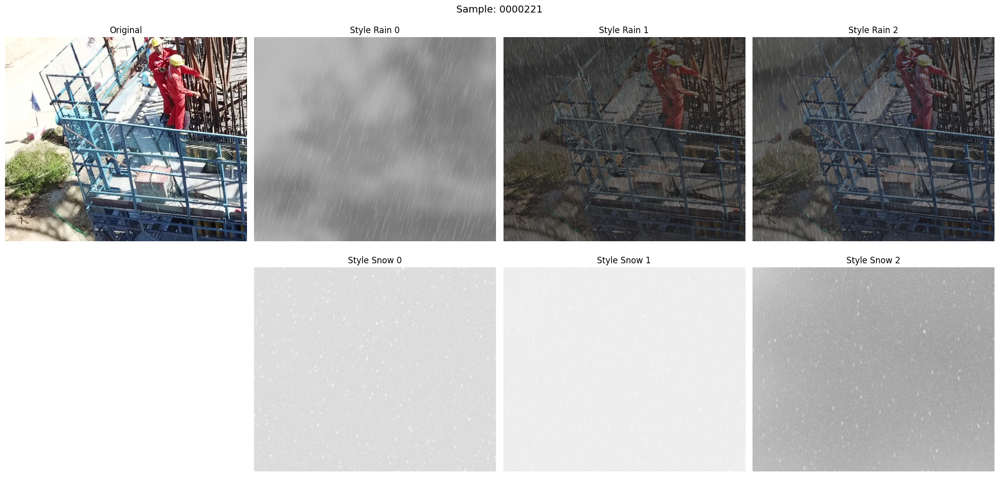

{'style_rain_0': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=906x765>,
 'style_rain_1': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=906x765>,
 'style_rain_2': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=906x765>,
 'style_snow_0': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=906x765>,
 'style_snow_1': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=906x765>,
 'style_snow_2': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=906x765>}

In [5]:
# Pick a random image_id or specify one
sample_ids = list(original_index.keys())
random_id = random.choice(sample_ids)
print(f"Visualizing random sample: {random_id}")

visualize_sample(random_id, original_table, original_index, AUGMENTED_DIR, STYLES)

## Visualize Specific Sample
Change `specific_id` to visualize any image by its ID

Available sample IDs (first 10): ['0000001', '0000002', '0000005', '0000007', '0000009', '0000010', '0000013', '0000014', '0000015', '0000017']

Visualizing: 0000001


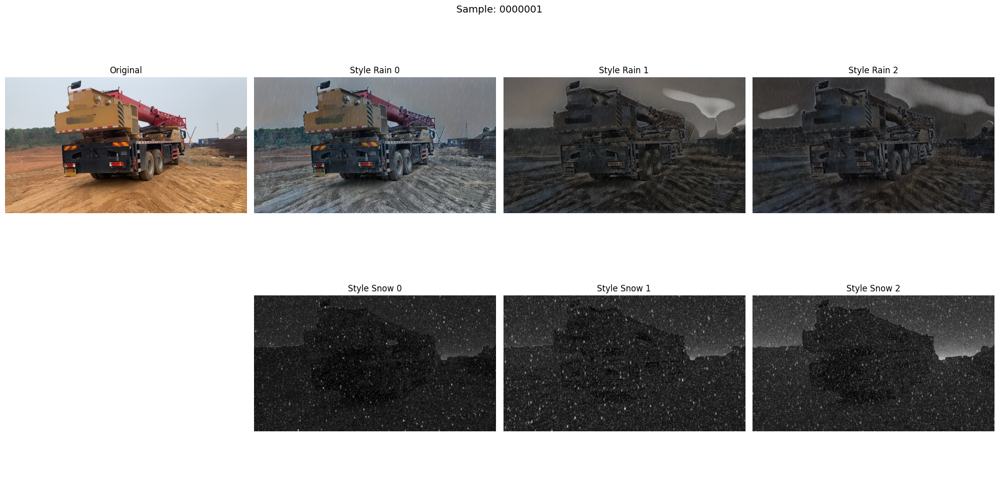

{'style_rain_0': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1200x675>,
 'style_rain_1': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1200x675>,
 'style_rain_2': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1200x675>,
 'style_snow_0': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1200x675>,
 'style_snow_1': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1200x675>,
 'style_snow_2': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1200x675>}

In [6]:
# Specify a particular image_id to visualize
specific_id = sample_ids[0]  # Change this to any valid image_id
print(f"Available sample IDs (first 10): {sample_ids[:10]}")
print(f"\nVisualizing: {specific_id}")

visualize_sample(specific_id, original_table, original_index, AUGMENTED_DIR, STYLES)

## Visualize Multiple Samples
Batch visualization for comparing quality across different images

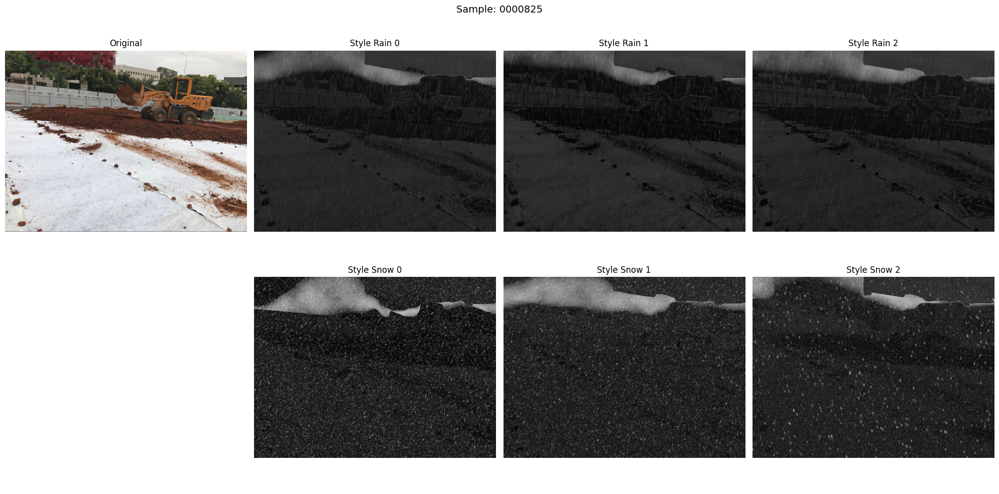

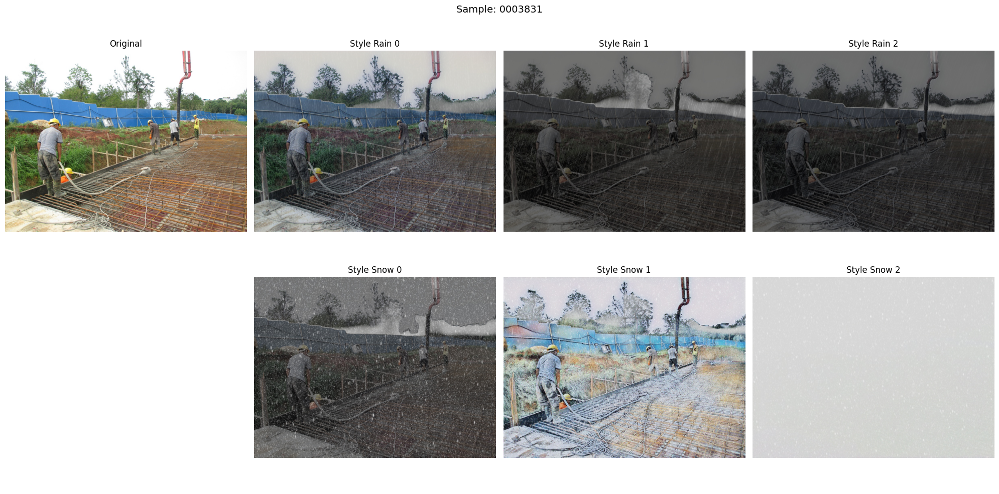

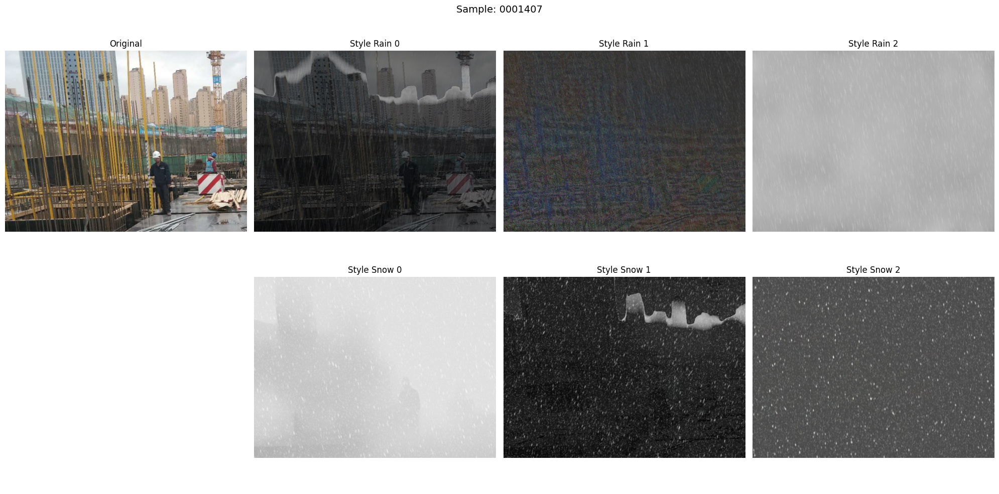

In [7]:
# Visualize multiple random samples
num_samples = 3  # Number of samples to visualize
random_samples = random.sample(sample_ids, min(num_samples, len(sample_ids)))

for sample_id in random_samples:
    print(f"\n{'='*50}")
    visualize_sample(sample_id, original_table, original_index, AUGMENTED_DIR, STYLES)

# SSIM-based Quality Filtering Analysis
Trích mẫu 100 ảnh gốc và ~600 augmentation, áp dụng các ngưỡng SSIM để lọc và đánh giá chất lượng

In [8]:
# Import thêm các thư viện cần thiết cho SSIM
from skimage.metrics import structural_similarity as ssim
from skimage import color, transform
import numpy as np
from tqdm import tqdm
import pandas as pd

print("Libraries imported successfully!")

Libraries imported successfully!


## 1. Trích mẫu 100 ảnh gốc

In [9]:
# Sample 100 random original images
random.seed(42)
sample_ids = list(original_index.keys())
sample_size = min(100, len(sample_ids))
sampled_ids = random.sample(sample_ids, sample_size)

print(f"Tổng số ảnh gốc: {len(sample_ids)}")
print(f"Số ảnh được lấy mẫu: {sample_size}")
print(f"Mẫu IDs đầu tiên: {sampled_ids[:5]}")
print(f"Số augmentation dự kiến: {sample_size * 6} (mỗi ảnh có 6 styles)")

Tổng số ảnh gốc: 3004
Số ảnh được lấy mẫu: 100
Mẫu IDs đầu tiên: ['0004235', '0000825', '0000213', '0001760', '0001587']
Số augmentation dự kiến: 600 (mỗi ảnh có 6 styles)


## 2. Hàm tính SSIM

In [10]:
def calculate_ssim_pil(img1, img2, target_size=(256, 256)):
    """
    Tính SSIM giữa 2 PIL Images
    
    Args:
        img1: PIL Image gốc
        img2: PIL Image augmented
        target_size: Kích thước resize để tính SSIM
    
    Returns:
        float: SSIM score (0-1)
    """
    try:
        # Convert to numpy arrays
        arr1 = np.array(img1.resize(target_size).convert('L'))  # Grayscale
        arr2 = np.array(img2.resize(target_size).convert('L'))
        
        # Normalize to 0-1
        arr1 = arr1.astype(np.float64) / 255.0
        arr2 = arr2.astype(np.float64) / 255.0
        
        # Calculate SSIM
        score = ssim(arr1, arr2, data_range=1.0)
        return score
    except Exception as e:
        print(f"Error calculating SSIM: {e}")
        return None

# Test SSIM function with first sample
test_id = sampled_ids[0]
test_orig_idx = original_index[test_id]
test_orig_row = original_table.slice(test_orig_idx, 1)
test_orig_img = get_image_from_row(test_orig_row)
test_aug_images = load_augmented_samples_by_ref_id(test_id, AUGMENTED_DIR, STYLES)

if test_aug_images:
    test_style = list(test_aug_images.keys())[0]
    test_ssim = calculate_ssim_pil(test_orig_img, test_aug_images[test_style])
    print(f"Test SSIM ({test_style}): {test_ssim:.4f}")
else:
    print("No augmented images found for test")

No augmented images found for test


## 3. Tính SSIM cho tất cả cặp ảnh gốc - augmentation

In [11]:
# Tính SSIM cho tất cả cặp ảnh
ssim_results = []

print("Đang tính SSIM cho tất cả cặp ảnh...")
print("Lưu ý: Quá trình này có thể mất vài phút\n")

for ref_id in tqdm(sampled_ids, desc="Processing images"):
    # Get original image
    orig_idx = original_index[ref_id]
    orig_row = original_table.slice(orig_idx, 1)
    orig_img = get_image_from_row(orig_row)
    
    if orig_img is None:
        continue
    
    # Get augmented images
    aug_images = load_augmented_samples_by_ref_id(ref_id, AUGMENTED_DIR, STYLES)
    
    for style, aug_img in aug_images.items():
        ssim_score = calculate_ssim_pil(orig_img, aug_img)
        if ssim_score is not None:
            ssim_results.append({
                'ref_id': ref_id,
                'style': style,
                'ssim': ssim_score,
                'original_img': orig_img,
                'augmented_img': aug_img
            })

print(f"\nTính xong SSIM cho {len(ssim_results)} cặp ảnh")

# Tạo DataFrame (không lưu ảnh trong DataFrame)
ssim_df = pd.DataFrame([{
    'ref_id': r['ref_id'],
    'style': r['style'],
    'ssim': r['ssim']
} for r in ssim_results])

print(f"\n{'='*50}")
print("THỐNG KÊ SSIM")
print('='*50)
print(ssim_df['ssim'].describe())

Đang tính SSIM cho tất cả cặp ảnh...
Lưu ý: Quá trình này có thể mất vài phút



Processing images: 100%|██████████| 100/100 [02:31<00:00,  1.51s/it]


Tính xong SSIM cho 570 cặp ảnh

THỐNG KÊ SSIM
count    570.000000
mean       0.354486
std        0.224596
min        0.045192
25%        0.167322
50%        0.283938
75%        0.499565
max        0.937394
Name: ssim, dtype: float64


## 4. Phân bố SSIM - Histogram

/tmp/ipykernel_371368/1622054125.py:15: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = axes[1].boxplot(style_data, labels=style_labels, patch_artist=True)


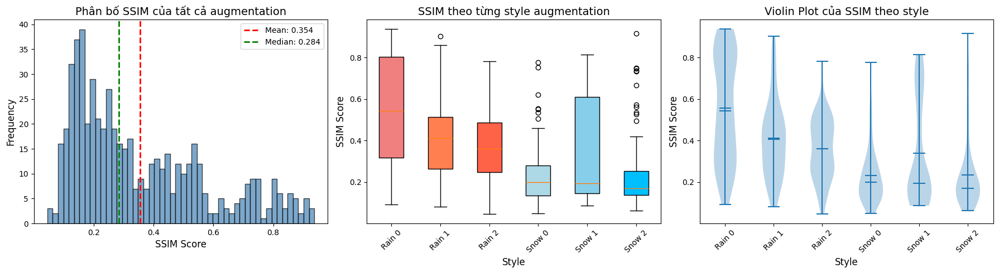


THỐNG KÊ SSIM THEO STYLE
              count   mean    std    min    max
style                                          
style_rain_0     95  0.555  0.254  0.091  0.937
style_rain_1     95  0.407  0.186  0.082  0.903
style_rain_2     95  0.360  0.146  0.045  0.783
style_snow_0     95  0.232  0.140  0.048  0.777
style_snow_1     95  0.338  0.248  0.086  0.814
style_snow_2     95  0.235  0.173  0.062  0.915


In [12]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Histogram tổng thể
axes[0].hist(ssim_df['ssim'], bins=50, edgecolor='black', alpha=0.7, color='steelblue')
axes[0].axvline(x=ssim_df['ssim'].mean(), color='red', linestyle='--', linewidth=2, label=f"Mean: {ssim_df['ssim'].mean():.3f}")
axes[0].axvline(x=ssim_df['ssim'].median(), color='green', linestyle='--', linewidth=2, label=f"Median: {ssim_df['ssim'].median():.3f}")
axes[0].set_xlabel('SSIM Score', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].set_title('Phân bố SSIM của tất cả augmentation', fontsize=14)
axes[0].legend()

# Box plot theo style
style_data = [ssim_df[ssim_df['style'] == s]['ssim'].values for s in STYLES if s in ssim_df['style'].values]
style_labels = [s.replace('style_', '').replace('_', ' ').title() for s in STYLES if s in ssim_df['style'].values]
bp = axes[1].boxplot(style_data, labels=style_labels, patch_artist=True)
colors = ['lightcoral', 'coral', 'tomato', 'lightblue', 'skyblue', 'deepskyblue']
for patch, c in zip(bp['boxes'], colors[:len(style_data)]):
    patch.set_facecolor(c)
axes[1].set_xlabel('Style', fontsize=12)
axes[1].set_ylabel('SSIM Score', fontsize=12)
axes[1].set_title('SSIM theo từng style augmentation', fontsize=14)
axes[1].tick_params(axis='x', rotation=45)

# Violin plot
axes[2].violinplot(style_data, positions=range(len(style_data)), showmeans=True, showmedians=True)
axes[2].set_xticks(range(len(style_labels)))
axes[2].set_xticklabels(style_labels, rotation=45)
axes[2].set_xlabel('Style', fontsize=12)
axes[2].set_ylabel('SSIM Score', fontsize=12)
axes[2].set_title('Violin Plot của SSIM theo style', fontsize=14)

plt.tight_layout()
plt.show()

# Thống kê theo style
print("\n" + "="*60)
print("THỐNG KÊ SSIM THEO STYLE")
print("="*60)
print(ssim_df.groupby('style')['ssim'].agg(['count', 'mean', 'std', 'min', 'max']).round(3))

## 5. Thử nghiệm các ngưỡng SSIM filter

In [ ]:
# Định nghĩa các ngưỡng SSIM để thử nghiệm
thresholds = [0.3, 0.4, 0.5, 0.6, 0.7, 0.8]

print("="*70)
print("PHÂN TÍCH CÁC NGƯỠNG SSIM FILTER")
print("="*70)

threshold_stats = []
for thresh in thresholds:
    kept = ssim_df[ssim_df['ssim'] >= thresh]
    removed = ssim_df[ssim_df['ssim'] < thresh]
    
    stats = {
        'threshold': thresh,
        'kept_count': len(kept),
        'removed_count': len(removed),
        'kept_percent': len(kept) / len(ssim_df) * 100,
        'removed_percent': len(removed) / len(ssim_df) * 100,
        'kept_mean_ssim': kept['ssim'].mean() if len(kept) > 0 else 0,
        'removed_mean_ssim': removed['ssim'].mean() if len(removed) > 0 else 0
    }
    threshold_stats.append(stats)
    
    print(f"\n📊 Ngưỡng SSIM >= {thresh}:")
    print(f"   ✅ Giữ lại: {stats['kept_count']:,} ảnh ({stats['kept_percent']:.1f}%)")
    print(f"   ❌ Loại bỏ: {stats['removed_count']:,} ảnh ({stats['removed_percent']:.1f}%)")
    print(f"   📈 SSIM trung bình ảnh giữ lại: {stats['kept_mean_ssim']:.3f}")

threshold_df = pd.DataFrame(threshold_stats)

## 6. Visualization các ngưỡng filter

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. Số lượng ảnh giữ lại vs loại bỏ theo ngưỡng
ax1 = axes[0, 0]
x = range(len(thresholds))
width = 0.35
bars1 = ax1.bar([i - width/2 for i in x], threshold_df['kept_count'], width, label='Giữ lại', color='green', alpha=0.7)
bars2 = ax1.bar([i + width/2 for i in x], threshold_df['removed_count'], width, label='Loại bỏ', color='red', alpha=0.7)
ax1.set_xlabel('Ngưỡng SSIM')
ax1.set_ylabel('Số lượng ảnh')
ax1.set_title('Số lượng ảnh giữ lại vs loại bỏ theo ngưỡng SSIM')
ax1.set_xticks(x)
ax1.set_xticklabels([str(t) for t in thresholds])
ax1.legend()

# 2. Phần trăm giữ lại
ax2 = axes[0, 1]
ax2.plot(thresholds, threshold_df['kept_percent'], 'go-', linewidth=2, markersize=10)
ax2.fill_between(thresholds, threshold_df['kept_percent'], alpha=0.3, color='green')
ax2.set_xlabel('Ngưỡng SSIM')
ax2.set_ylabel('Phần trăm giữ lại (%)')
ax2.set_title('Phần trăm ảnh giữ lại theo ngưỡng SSIM')
ax2.grid(True, alpha=0.3)
for i, (thresh, pct) in enumerate(zip(thresholds, threshold_df['kept_percent'])):
    ax2.annotate(f'{pct:.1f}%', (thresh, pct), textcoords="offset points", xytext=(0,10), ha='center', fontweight='bold')

# 3. Histogram với các ngưỡng
ax3 = axes[1, 0]
ax3.hist(ssim_df['ssim'], bins=50, edgecolor='black', alpha=0.5, color='steelblue')
colors_thresh = plt.cm.RdYlGn(np.linspace(0, 1, len(thresholds)))
for thresh, c in zip(thresholds, colors_thresh):
    ax3.axvline(x=thresh, color=c, linestyle='--', linewidth=2, label=f'T={thresh}')
ax3.set_xlabel('SSIM Score')
ax3.set_ylabel('Frequency')
ax3.set_title('Histogram SSIM với các ngưỡng filter')
ax3.legend(loc='upper left', fontsize=9)

# 4. Trade-off: Số ảnh còn lại vs chất lượng trung bình
ax4 = axes[1, 1]
scatter = ax4.scatter(threshold_df['kept_count'], threshold_df['kept_mean_ssim'], 
                      c=thresholds, cmap='viridis', s=200, edgecolors='black')
for i, thresh in enumerate(thresholds):
    ax4.annotate(f'T={thresh}', 
                (threshold_df['kept_count'].iloc[i], threshold_df['kept_mean_ssim'].iloc[i]),
                textcoords="offset points", xytext=(10,5), fontsize=10, fontweight='bold')
ax4.set_xlabel('Số ảnh giữ lại')
ax4.set_ylabel('SSIM trung bình ảnh giữ lại')
ax4.set_title('Trade-off: Số lượng vs Chất lượng')
ax4.grid(True, alpha=0.3)
plt.colorbar(scatter, ax=ax4, label='Threshold')

plt.tight_layout()
plt.show()

## 7. Visualize mẫu ảnh theo từng ngưỡng
So sánh trực quan ảnh bị loại bỏ vs ảnh được giữ lại với từng ngưỡng SSIM

In [ ]:
def get_image_pair(ref_id, style, original_table, original_index, augmented_dir, styles):
    """Lấy cặp ảnh original - augmented"""
    # Get original
    orig_idx = original_index[ref_id]
    orig_row = original_table.slice(orig_idx, 1)
    orig_img = get_image_from_row(orig_row)
    
    # Get augmented
    aug_images = load_augmented_samples_by_ref_id(ref_id, augmented_dir, [style])
    aug_img = aug_images.get(style, None)
    
    return orig_img, aug_img

def visualize_samples_by_threshold(ssim_df, threshold, n_samples=5):
    """Hiển thị mẫu ảnh giữ lại và loại bỏ theo ngưỡng"""
    
    kept = ssim_df[ssim_df['ssim'] >= threshold].sort_values('ssim', ascending=False)
    removed = ssim_df[ssim_df['ssim'] < threshold].sort_values('ssim', ascending=True)
    
    fig, axes = plt.subplots(4, n_samples, figsize=(n_samples * 3.5, 14))
    fig.suptitle(f'Ngưỡng SSIM = {threshold}\n(Giữ lại: {len(kept)} ảnh | Loại bỏ: {len(removed)} ảnh)', 
                 fontsize=14, fontweight='bold')
    
    # Row 1 & 2: Ảnh giữ lại (SSIM cao nhất)
    for i in range(min(n_samples, len(kept))):
        row = kept.iloc[i]
        orig_img, aug_img = get_image_pair(row['ref_id'], row['style'], 
                                            original_table, original_index, AUGMENTED_DIR, STYLES)
        
        # Original
        if orig_img:
            axes[0, i].imshow(orig_img)
        axes[0, i].set_title(f"Original", fontsize=9)
        axes[0, i].axis('off')
        if i == 0:
            axes[0, i].set_ylabel('GIỮ LẠI\n(Original)', fontsize=10, fontweight='bold', color='green')
        
        # Augmentation
        if aug_img:
            axes[1, i].imshow(aug_img)
        axes[1, i].set_title(f"SSIM={row['ssim']:.3f}\n{row['style']}", fontsize=9, color='green', fontweight='bold')
        axes[1, i].axis('off')
        if i == 0:
            axes[1, i].set_ylabel('GIỮ LẠI\n(Augmented)', fontsize=10, fontweight='bold', color='green')
    
    # Row 3 & 4: Ảnh loại bỏ (SSIM thấp nhất)
    for i in range(min(n_samples, len(removed))):
        row = removed.iloc[i]
        orig_img, aug_img = get_image_pair(row['ref_id'], row['style'],
                                            original_table, original_index, AUGMENTED_DIR, STYLES)
        
        # Original
        if orig_img:
            axes[2, i].imshow(orig_img)
        axes[2, i].set_title(f"Original", fontsize=9)
        axes[2, i].axis('off')
        if i == 0:
            axes[2, i].set_ylabel('LOẠI BỎ\n(Original)', fontsize=10, fontweight='bold', color='red')
        
        # Augmentation
        if aug_img:
            axes[3, i].imshow(aug_img)
        axes[3, i].set_title(f"SSIM={row['ssim']:.3f}\n{row['style']}", fontsize=9, color='red', fontweight='bold')
        axes[3, i].axis('off')
        if i == 0:
            axes[3, i].set_ylabel('LOẠI BỎ\n(Augmented)', fontsize=10, fontweight='bold', color='red')
    
    # Ẩn các ô trống
    for ax_row in axes:
        for ax in ax_row:
            if not ax.images and not ax.texts:
                ax.axis('off')
    
    plt.tight_layout()
    plt.show()

In [ ]:
# Visualize cho các ngưỡng quan trọng
print("\n" + "="*70)
print("VISUALIZATION MẪU ẢNH THEO CÁC NGƯỠNG SSIM")
print("="*70)

for thresh in [0.4, 0.5, 0.6, 0.7]:
    print(f"\n--- Ngưỡng SSIM = {thresh} ---")
    visualize_samples_by_threshold(ssim_df, thresh, n_samples=5)

## 8. Phân tích chi tiết - Top và Bottom SSIM

In [ ]:
# Top ảnh có SSIM cao nhất và thấp nhất
print("="*70)
print("TOP 10 ẢNH CÓ SSIM CAO NHẤT (chất lượng augmentation tốt nhất)")
print("="*70)
print(ssim_df.nlargest(10, 'ssim')[['ref_id', 'style', 'ssim']].to_string(index=False))

print("\n" + "="*70)
print("TOP 10 ẢNH CÓ SSIM THẤP NHẤT (augmentation khác biệt nhiều)")
print("="*70)
print(ssim_df.nsmallest(10, 'ssim')[['ref_id', 'style', 'ssim']].to_string(index=False))

In [ ]:
# Visualization top và bottom SSIM
fig, axes = plt.subplots(4, 5, figsize=(18, 14))
fig.suptitle('Top 5 SSIM CAO vs Top 5 SSIM THẤP', fontsize=16, fontweight='bold')

# Top 5 SSIM cao
top5 = ssim_df.nlargest(5, 'ssim')
for i, (_, row) in enumerate(top5.iterrows()):
    orig_img, aug_img = get_image_pair(row['ref_id'], row['style'],
                                        original_table, original_index, AUGMENTED_DIR, STYLES)
    # Original
    if orig_img:
        axes[0, i].imshow(orig_img)
    axes[0, i].set_title('Original', fontsize=9)
    axes[0, i].axis('off')
    
    # Augmentation
    if aug_img:
        axes[1, i].imshow(aug_img)
    axes[1, i].set_title(f'SSIM={row["ssim"]:.3f}\n{row["style"]}', fontsize=9, color='green', fontweight='bold')
    axes[1, i].axis('off')

axes[0, 0].text(-0.15, 0.5, 'TOP SSIM\n(Tốt)', transform=axes[0, 0].transAxes, 
                fontsize=12, fontweight='bold', color='green', va='center', rotation=90)

# Bottom 5 SSIM
bottom5 = ssim_df.nsmallest(5, 'ssim')
for i, (_, row) in enumerate(bottom5.iterrows()):
    orig_img, aug_img = get_image_pair(row['ref_id'], row['style'],
                                        original_table, original_index, AUGMENTED_DIR, STYLES)
    # Original
    if orig_img:
        axes[2, i].imshow(orig_img)
    axes[2, i].set_title('Original', fontsize=9)
    axes[2, i].axis('off')
    
    # Augmentation
    if aug_img:
        axes[3, i].imshow(aug_img)
    axes[3, i].set_title(f'SSIM={row["ssim"]:.3f}\n{row["style"]}', fontsize=9, color='red', fontweight='bold')
    axes[3, i].axis('off')

axes[2, 0].text(-0.15, 0.5, 'BOTTOM SSIM\n(Kém)', transform=axes[2, 0].transAxes,
                fontsize=12, fontweight='bold', color='red', va='center', rotation=90)

plt.tight_layout()
plt.show()

## 9. Khuyến nghị ngưỡng SSIM

In [ ]:
print("="*70)
print("KHUYẾN NGHỊ NGƯỠNG SSIM")
print("="*70)

print("""
Dựa trên phân tích trên, các ngưỡng SSIM khuyến nghị:

1. SSIM >= 0.3 (Lỏng): 
   - Giữ lại hầu hết augmentation
   - Chỉ loại bỏ những augmentation cực kỳ khác biệt
   - Phù hợp khi muốn tăng diversity

2. SSIM >= 0.5 (Trung bình):
   - Cân bằng giữa diversity và chất lượng
   - Loại bỏ các augmentation quá aggressive
   - KHUYẾN NGHỊ cho hầu hết trường hợp

3. SSIM >= 0.6 (Chặt):
   - Chỉ giữ augmentation có chất lượng cao
   - Đảm bảo augmentation không làm mất thông tin quan trọng
   - Phù hợp khi dataset đã đủ lớn

4. SSIM >= 0.7 (Rất chặt):
   - Chỉ giữ augmentation gần giống original
   - Phù hợp cho object detection với bounding box nhạy cảm
   - Có thể làm giảm diversity quá nhiều
""")

# Summary table
print("\n" + "="*70)
print("BẢNG TÓM TẮT CÁC NGƯỠNG")
print("="*70)
summary_display = threshold_df[['threshold', 'kept_count', 'kept_percent', 'removed_count', 'kept_mean_ssim']].copy()
summary_display.columns = ['Ngưỡng', 'Giữ lại', 'Tỉ lệ giữ (%)', 'Loại bỏ', 'SSIM TB']
print(summary_display.to_string(index=False))

## 10. Lưu kết quả phân tích (tùy chọn)